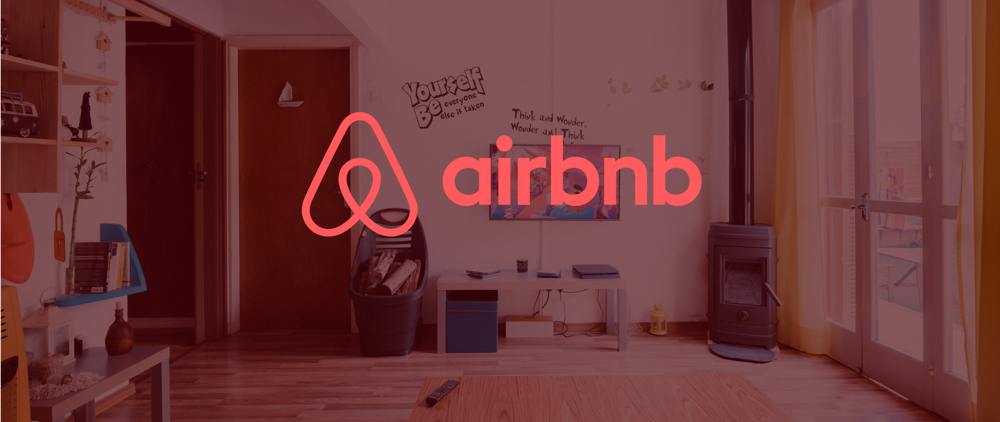

### Abstract 

##### Objective and Motivation of the notebook

Airbnb, born with a creative spirit, is an online marketplace that connects people who want to rent out their homes with people who are looking for accommodations in that locale ultimately providing a more unique and personalized way of experiencing the world. The source of motivation of our problem statement as a social impact is to help people in making informed and meaningful decisions when choosing for their accommodation and whereas for the organization it can be used by decision-makers to take appropriate action with the aim of enhancing productivity and business gain. The idea is to simply understand the key metrics to explore data in meaningful ways as data in itself is merely facts and figures.

### Data Informatics

The dataset consists of almost <b>50 thousand</b>  listing activity and <b>16 metrics</b>  in NYC, NY for the year <b>2019</b>. The data file includes all the information to find out more about hosts, geographical availability, review ratings etc. necessary to make predictions and draw suitable conclusions. Here for our analysis we will be organizing, interpreting, re-structuring and present the data into useful information that provides comprehensive results with visualization representations in an easily-digestible format.

### Acquiring and Loading Data

##### _Presenting the code and methods for acquiring the data. Loading the data into appropriate format for analysis. Explaining the process and results_

In [1]:
#importing necessery libraries for future analysis of the dataset
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
%matplotlib inline
import seaborn as sns
import plotly
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

In [2]:
#using pandas library and 'read_csv' function to read AB_NYC_2019 csv file as file already formated for us from Kaggle
data_filename = 'AB_NYC_2019.csv'
airbnb=pd.read_csv(data_filename)
#examing head of AB_NYC_2019 csv file 
airbnb.head(7)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0
5,5099,Large Cozy 1 BR Apartment In Midtown East,7322,Chris,Manhattan,Murray Hill,40.74767,-73.97500,Entire home/apt,200,3,74,2019-06-22,0.59,1,129
6,5121,BlissArtsSpace!,7356,Garon,Brooklyn,Bedford-Stuyvesant,40.68688,-73.95596,Private room,60,45,49,2017-10-05,0.40,1,0


In [3]:
#checking amount of rows in given dataset to understand the size we are working with

len(airbnb)

48895

In [4]:
#checking type of every column in the dataset

airbnb.dtypes

id                                  int64
name                               object
host_id                             int64
host_name                          object
neighbourhood_group                object
neighbourhood                      object
latitude                          float64
longitude                         float64
room_type                          object
price                               int64
minimum_nights                      int64
number_of_reviews                   int64
last_review                        object
reviews_per_month                 float64
calculated_host_listings_count      int64
availability_365                    int64
dtype: object

After loading the dataset in and from the head of AB_2019_NYC dataset we can see a number of things. There are in total 16 columns providing a very rich amount of information for deep data exploration we can do on this dataset. We do already see some missing values, which will require cleaning and handling of NaN values.

### Understadning, Wrangling and Cleaning Data

##### _Presenting the code and methods for acquiring the data. Loading the data into appropriate format for analysis. Explaining the process and results_

In [5]:
#after looking at the head of the dataset we already were able to notice some NaN values, therefore need to examine missing values further before continuing with analysis

#looking to find out first what columns have null values
#using 'sum' function will show us how many nulls are found in each column in dataset
airbnb.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

In our case, missing data that is observed does not need too much special treatment. Looking into the nature of our dataset we can state further things: columns "name" and "host_name" are irrelevant and insignificant to our data analysis, columns "last_review" and "review_per_month" need very simple handling. To elaborate, "last_review" is date; if there were no reviews for the listing - date simply will not exist. In our case, this column is irrelevant and insignificant therefore appending those values is not needed. For "review_per_month" column we can simply append it with 0.0 for missing values; we can see that in "number_of_review" that column will have a 0, therefore following this logic with 0 total reviews there will be 0.0 rate of reviews per month. Therefore, let's proceed with removing columns that are not important and handling of missing data.

In [6]:
#dropping columns that are not significant or could be unethical to use for our future data exploration and predictions
airbnb.drop(['id','host_name','last_review'], axis=1, inplace=True)
#examing the changes
airbnb.head(3)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
0,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,0.21,6,365
1,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,0.38,2,355
2,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,1,365


Please note that we are dropping'host_name' not only because it is insignificant but also for ethical reasons. There should be no reasoning to continue data exploration and model training (which we will be doing later) towards specific individuals based on their names. Why is that? Those names are assigned to actual humans, also they present no security threat or military/governmental interest based on the nature of the dataset, therefore names are unimportant to us.

In [7]:
#replacing all NaN values in 'reviews_per_month' with 0
airbnb.fillna({'reviews_per_month':0}, inplace=True)
#examing changes
airbnb.reviews_per_month.isnull().sum()

0

In [8]:
#let's proceed with examing some interesting categorical unique values

#examining the unique values of n_group as this column will appear very handy for later analysis
airbnb.neighbourhood_group.unique()

array(['Brooklyn', 'Manhattan', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [9]:
#examining the unique values of neighbourhood as this column will appear very handy for later analysis
len(airbnb.neighbourhood.unique())

221

In [10]:
#examining the unique values of room_type as this column will appear very handy for later analysis
airbnb.room_type.unique()

array(['Private room', 'Entire home/apt', 'Shared room'], dtype=object)

Understanding unique values and categorical data that we have in our dataset was the last step we had to do. It looks like for those columns' values we will be doing some mapping to prepare the dataset for predictive analysis.

# Database Normalization

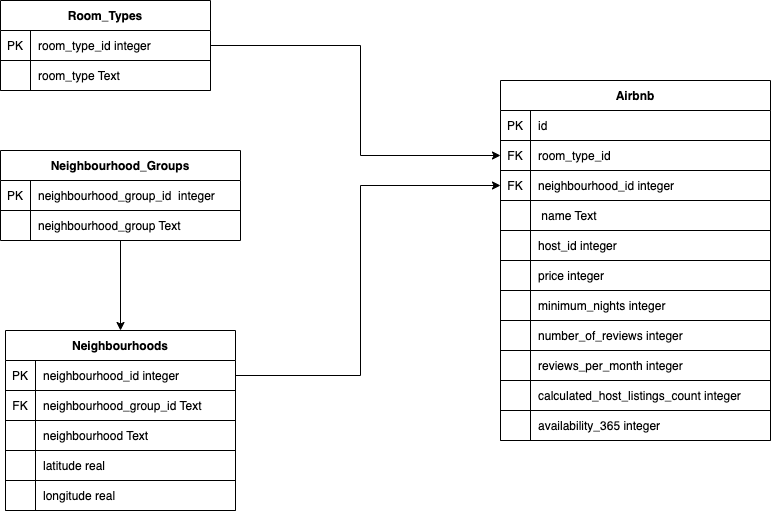

In [11]:
### Utility Functions
from IPython.display import display, HTML
import pandas as pd
import sqlite3
from sqlite3 import Error

def create_connection(db_file, delete_db=False):
    import os
    if delete_db and os.path.exists(db_file):
        os.remove(db_file)

    conn = None
    try:
        conn = sqlite3.connect(db_file)
        conn.execute("PRAGMA foreign_keys = 1")
    except Error as e:
        print(e)

    return conn


def create_table(conn, create_table_sql, drop_table_name=None):
    
    if drop_table_name: # You can optionally pass drop_table_name to drop the table. 
        try:
            c = conn.cursor()
            c.execute("""DROP TABLE IF EXISTS %s""" % (drop_table_name))
        except Error as e:
            print(e)
    
    try:
        c = conn.cursor()
        c.execute(create_table_sql)
    except Error as e:
        print(e)
        
def execute_sql_statement(sql_statement, conn):
    cur = conn.cursor()
    cur.execute(sql_statement)

    rows = cur.fetchall()

    return rows


In [12]:

normalized_database_filename = 'normalized.db'
conn = create_connection(normalized_database_filename, delete_db=False)


In [13]:
#     Normalize 'non_normalized.db'
#     Call the normalized database 'normalized.db'
#     Function Output: No outputs
#     Requirements:
#     Create 5 tables

#     room_types table has one column:
#         [room_type_id] column is the primary key
#         [room_type]

#     neighbourhood_groups table has one column:
#         [neighbourhood_group_id] column is the primary key
#         [neighbourhood_group] 

#     neighbourhoods table has one column:
#         [neighbourhood_id] column is the primary key
#         [neighbourhood_group_id] FK to neighbourhood_groups
#         [latitude] 
#         [longitude] 
            
#      Airbnb table has columns:
#         [id] primary key column,
#         [name] Text not null,
#         [host_id] foreign key to hosts table ,
#         [neighbourhood_id] foreign key to neighbourhoods table ,
#         [room_type_id] foreign key to room_types table ,
#         [price] 
#         [minimum_nights] 
#         [number_of_reviews] 
#         [reviews_per_month] 
#         [calculated_host_listings_count] 
#         [availability_365] 

create_table_room_types = '''CREATE TABLE IF NOT EXISTS room_types (
         [room_type_id] integer not null Primary Key autoincrement,
         [room_type] Text not null);''' 

create_table_neighbourhood_groups = '''CREATE TABLE IF NOT EXISTS neighbourhood_groups (
         [neighbourhood_group_id] integer not null Primary Key autoincrement,
         [neighbourhood_group] Text not null);''' 

create_table_neighbourhoods = '''CREATE TABLE IF NOT EXISTS neighbourhoods (
      [neighbourhood_id] integer not null Primary Key autoincrement,
      [neighbourhood_group_id] REFERENCES neighbourhood_groups(neighbourhood_group_id),
      [neighbourhood] Text not null,
      [latitude] Real,
      [longitude] Real);''' 

create_table_airbnb = '''CREATE TABLE IF NOT EXISTS Airbnb (
       [id] integer not null Primary Key autoincrement,
       [name] Text,
       [neighbourhood_id] REFERENCES neighbourhoods(neighbourhood_id),
       [room_type_id] REFERENCES room_types(room_type_id),
       [host_id] integer,
       [price] integer,
       [minimum_nights] integer,
       [number_of_reviews] integer,
       [reviews_per_month] real,
       [calculated_host_listings_count] integer,
       [availability_365] integer);''' 

conn = create_connection(normalized_database_filename)
create_table(conn, create_table_room_types, True)
create_table(conn, create_table_neighbourhood_groups, True)
create_table(conn, create_table_neighbourhoods, True)
create_table(conn, create_table_airbnb, True)

In [14]:
# Insertion of Room Type Data into RoomTypes Table

def insert_room_types_data(data_filename, normalized_database_filename):
    airbnb=pd.read_csv(data_filename)
    room_types = airbnb['room_type'].tolist()
    room_types = list(set(zip(airbnb['room_type'].tolist())))
    room_types = sorted(room_types, key=lambda tup: tup[0])
    with conn:
        insert_query = """INSERT INTO room_types(room_type)
                                VALUES(?)"""
        curr = conn.cursor()
        curr.executemany(insert_query, room_types)
        return curr.lastrowid
    
insert_room_types_data(data_filename, normalized_database_filename)

In [15]:
# Creation of RoomType dictionary

def room_type_dictionary(normalized_database_filename):
    result = {}
    conn = create_connection(normalized_database_filename)
    query = "select room_type, room_type_id from room_types;"
    data = execute_sql_statement(query,conn)    
    for key,value in data:
        result[key] = value
    return result

In [16]:
# Insertion of neighbourhood_groups Data into NeighbourhoodGroups Table

def insert_neighbourhood_groups_data(data_filename, normalized_database_filename):
    airbnb=pd.read_csv(data_filename)
    neighbourhood_groups = airbnb['neighbourhood_group'].tolist()
    neighbourhood_groups = list(set(zip(airbnb['neighbourhood_group'].tolist())))
    neighbourhood_groups = sorted(neighbourhood_groups, key=lambda tup: tup[0])
    with conn:
        insert_query = """INSERT INTO neighbourhood_groups(neighbourhood_group)
                                VALUES(?)"""
        curr = conn.cursor()
        curr.executemany(insert_query, neighbourhood_groups)
        return curr.lastrowid

insert_neighbourhood_groups_data(data_filename, normalized_database_filename)

In [17]:
# Creation of neighbourhood_groups dictionary

def neighbourhood_groups_dictionary(normalized_database_filename):
    result = {}
    conn = create_connection(normalized_database_filename)
    query = "select neighbourhood_group, neighbourhood_group_id from neighbourhood_groups;"
    data = execute_sql_statement(query,conn)    
    for key,value in data:
        result[key] = value
    return result

In [18]:
# Insertion of neighbourhood Data into Neighbourhoods Table

def insert_neighbourhoods_data(data_filename, normalized_database_filename):
    airbnb=pd.read_csv(data_filename)
    dictionary = neighbourhood_groups_dictionary(normalized_database_filename)
    neighbourhoods = airbnb['neighbourhood'].tolist()
    neighbourhood_group_ids = [dictionary[i] for i in airbnb['neighbourhood_group'].tolist()]
    latitude = [round(i,5) for i in airbnb['latitude'].tolist()]
    longitude = [round(i,5) for i in airbnb['longitude'].tolist()]
    values = list(set(zip(neighbourhoods, neighbourhood_group_ids, latitude, longitude)))
    values = sorted(values, key=lambda tup: tup[0])
    with conn:
        insert_query = """INSERT INTO neighbourhoods(neighbourhood, neighbourhood_group_id, latitude, longitude)
                                VALUES(?,?,?,?)"""
        curr = conn.cursor()
        curr.executemany(insert_query, values)
        return curr.lastrowid
    
insert_neighbourhoods_data(data_filename, normalized_database_filename)

In [19]:
# Creation of neighbourhood dictionary

def neighbourhoods_dictionary(normalized_database_filename):
    result = {}
    conn = create_connection(normalized_database_filename)
    query = "select neighbourhood, latitude, longitude, neighbourhood_id from neighbourhoods;"
    data = execute_sql_statement(query,conn)  
    for neighbourhood, latitude, longitude,value in data:
        result[(neighbourhood, latitude, longitude)] = value
    return result

In [20]:
# Creation of neighbourhood and neighbourhood_groups dictionary

def neighbourhood_id_and_neighbourhood_group_id_dict(normalized_database_filename):
    result = {}
    conn = create_connection(normalized_database_filename)
    query = "select neighbourhood_id, neighbourhood_group_id from neighbourhoods;"
    data = execute_sql_statement(query,conn)  
    for key,value in data:
        result[key] = value
    return result

In [21]:
# Insertion of neighbourhood Data into Neighbourhoods Table

def insert_airbnb_data(data_filename, normalized_database_filename):
    airbnb=pd.read_csv(data_filename)
    airbnb.fillna({'reviews_per_month':0}, inplace=True)
    values =[]
    neighbourhoods_dict = neighbourhoods_dictionary(normalized_database_filename)
    room_type_dict = room_type_dictionary(normalized_database_filename)
    for index, row in airbnb.iterrows():
        values.append((str(row['name']),row['host_id'],neighbourhoods_dict[(row['neighbourhood'], round(row['latitude'],5), round(row['longitude'],5))],
                          room_type_dict[row['room_type']],row['price'], row['minimum_nights'],row['number_of_reviews'],row['reviews_per_month'],
                          row['calculated_host_listings_count'],row['availability_365']))

    values = sorted(values, key=lambda x: x[0])
    with conn:
        insert_query = """INSERT INTO airbnb(name,host_id,neighbourhood_id,room_type_id,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365)
                                VALUES(?,?,?,?,?,?,?,?,?,?)"""
        curr = conn.cursor()
        curr.executemany(insert_query, values)
        return curr.lastrowid
    
insert_airbnb_data(data_filename, normalized_database_filename)

In [22]:
# Extracting data from different tables using joins and constructing a data frame for visualisations and EDA

def get_airbnb_data(normalized_database_filename):
    conn = create_connection(normalized_database_filename)
    query = "select name, host_id, neighbourhood_group, neighbourhood, latitude,longitude, room_type, price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365 from Airbnb inner join room_types using(room_type_id) inner join neighbourhoods using(neighbourhood_id) inner join neighbourhood_groups using(neighbourhood_group_id) order by name;"
    db_data = execute_sql_statement(query,conn) 
    airbnb_column_names = ['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude', 'longitude', 'room_type', 'price','minimum_nights','number_of_reviews','reviews_per_month','calculated_host_listings_count','availability_365']
    df = pd.DataFrame(db_data ,columns = airbnb_column_names)
    df['reviews_per_month'] = round(df['reviews_per_month'],2)
    return df

airbnb = get_airbnb_data(normalized_database_filename)

### Exploring and Visualizing Data

##### Exploring the data by analyzing its statistics and visualizing the values of features and correlations between different features. Explaining the process and the results

Now that we are ready for an exploration of our data,we may prefer some datasets have a big number of attributes, plus this way we will remember to explore each column individually to make sure we learn as much as we can about our dataset.

# Features Correlation Matrix 

Index(['name', 'host_id', 'neighbourhood_group', 'neighbourhood', 'latitude',
       'longitude', 'room_type', 'price', 'minimum_nights',
       'number_of_reviews', 'reviews_per_month',
       'calculated_host_listings_count', 'availability_365'],
      dtype='object')

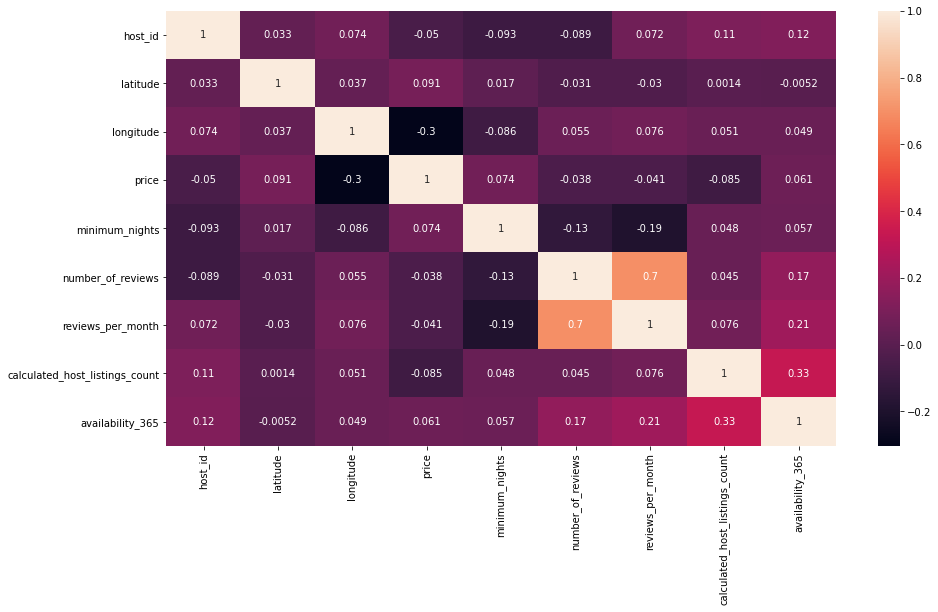

In [23]:
corr = airbnb.corr(method='kendall')
plt.figure(figsize=(15,8))
sns.heatmap(corr, annot=True)
airbnb.columns

# Visual Representation and Inferences - Host Data

In [24]:
#we will skip first column for now and begin from host_id
#coming back to our dataset we can confirm our fidnings with already existing column called 'calculated_host_listings_count'

top_host=airbnb.host_id.value_counts().head(10)
top_host_df=pd.DataFrame(top_host)
top_host_df.reset_index(inplace=True)
top_host_df.rename(columns={'index':'Host_ID', 'host_id':'P_Count'}, inplace=True)
top_host_df

,Host_ID,P_Count
0,219517861,327
1,107434423,232
2,30283594,121
3,137358866,103
4,16098958,96
5,12243051,96
6,61391963,91
7,22541573,87
8,200380610,65
9,1475015,52


[Text(0, 0, '1475015'),
 Text(1, 0, '12243051'),
 Text(2, 0, '16098958'),
 Text(3, 0, '22541573'),
 Text(4, 0, '30283594'),
 Text(5, 0, '61391963'),
 Text(6, 0, '107434423'),
 Text(7, 0, '137358866'),
 Text(8, 0, '200380610'),
 Text(9, 0, '219517861')]

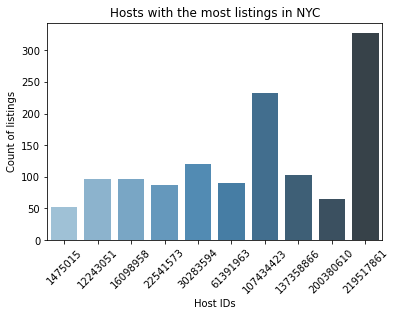

In [25]:
viz_1=sns.barplot(x="Host_ID", y="P_Count", data=top_host_df,
                 palette='Blues_d')
viz_1.set_title('Hosts with the most listings in NYC')
viz_1.set_ylabel('Count of listings')
viz_1.set_xlabel('Host IDs')
viz_1.set_xticklabels(viz_1.get_xticklabels(), rotation=45)

Interesting, we can see that there is a good distribution between top 10 hosts with the most listings. First host has more than 300+ listings.

# Visual Representation and Inferences - Reviews  Data

In [26]:
#last column we need to look at is 'number_of_reviews'

#let's grab 10 most reviewed listings in NYC

top_reviewed_listings=airbnb.nlargest(10,'number_of_reviews')
top_reviewed_listings

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
37293,Room near JFK Queen Bed,47621202,Queens,Jamaica,40.66730,-73.76831,Private room,47,1,629,14.58,2,333
21262,Great Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82085,-73.94025,Private room,49,1,607,7.75,3,293
5785,Beautiful Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82124,-73.93838,Private room,49,1,597,7.72,3,342
33414,Private Bedroom in Manhattan,4734398,Manhattan,Harlem,40.82264,-73.94041,Private room,49,1,594,7.57,3,339
36921,Room Near JFK Twin Beds,47621202,Queens,Jamaica,40.66939,-73.76975,Private room,47,1,576,13.40,2,173
41385,Steps away from Laguardia airport,37312959,Queens,East Elmhurst,40.77006,-73.87683,Private room,46,1,543,11.59,5,163
28273,Manhattan Lux Loft.Like.Love.Lots.Look !,2369681,Manhattan,Lower East Side,40.71921,-73.99116,Private room,99,2,540,6.95,1,179
15509,Cozy Room Family Home LGA Airport NO CLEANING FEE,26432133,Queens,East Elmhurst,40.76335,-73.87007,Private room,48,1,510,16.22,5,341
34760,Private brownstone studio Brooklyn,12949460,Brooklyn,Park Slope,40.67926,-73.97711,Entire home/apt,160,1,488,8.14,1,269
24297,LG Private Room/Family Friendly,792159,Brooklyn,Bushwick,40.70283,-73.92131,Private room,60,3,480,6.70,1,0


There is no reason to visualize this as table format would be the most suitable output for better reading. From this table output, we can observe that top 10 most reviewed listings on Airbnb for NYC has price average of \\$65 with most of the listings under \\$50, and 9/10 of them are 'Private room' type; top reviewed listing has 629 reviews.

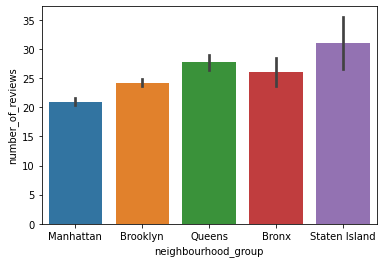

In [27]:
# Generation of the neighbourhood_group vs number_of_reviews

result = airbnb.groupby(["neighbourhood_group"])['number_of_reviews'].aggregate(np.median).reset_index().sort_values('number_of_reviews')
sns.barplot(x='neighbourhood_group', y="number_of_reviews", data=airbnb, order=result['neighbourhood_group']) #formerly: sns.barplot(x='Id', y="Speed", data=df, palette=colors, order=result['Id'])
plt.show()

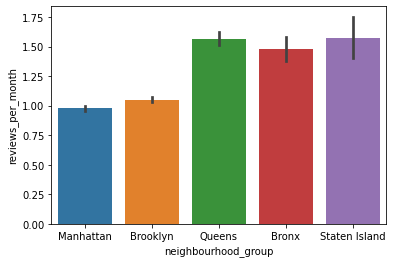

In [28]:
# Generation of the neighbourhood_group vs reviews_per_month

result = airbnb.groupby(["neighbourhood_group"])['reviews_per_month'].aggregate(np.median).reset_index().sort_values('reviews_per_month')
sns.barplot(x='neighbourhood_group', y="reviews_per_month", data=airbnb, order=result['neighbourhood_group']) #formerly: sns.barplot(x='Id', y="Speed", data=df, palette=colors, order=result['Id'])
plt.show()

# Visual Representation and Inferences -Number of Listings

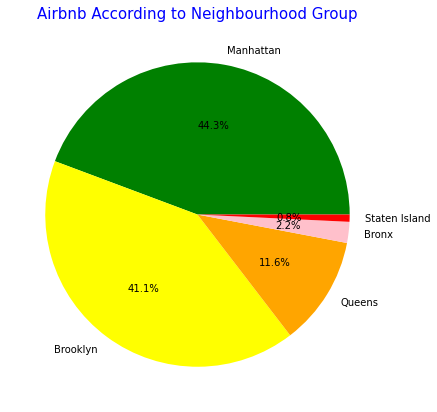

In [29]:
# Generation of the listings count according to neighbourhood_group

labels = airbnb.neighbourhood_group.value_counts().index
colors = ['green','yellow','orange','pink','red']
explode = [0,0,0,0,0]
sizes = airbnb.neighbourhood_group.value_counts().values

plt.figure(0,figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Airbnb According to Neighbourhood Group',color = 'blue',fontsize = 15)
plt.show()

<AxesSubplot:xlabel='neighbourhood_group', ylabel='count'>

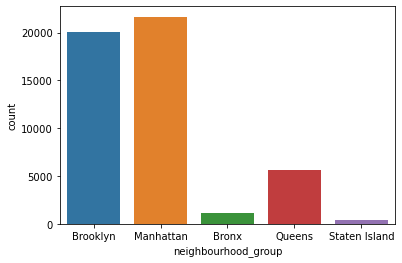

In [30]:
# Let us now take a look at how many properties are there in each neighbourhood group

sns.countplot(x = 'neighbourhood_group', data = airbnb) 

In [31]:
# Grabbing top 10 neighbourhoods that have the most listings
#finding out top 10 neighbourhoods

airbnb.neighbourhood.value_counts().head(10)

Williamsburg          3920
Bedford-Stuyvesant    3714
Harlem                2658
Bushwick              2465
Upper West Side       1971
Hell's Kitchen        1958
East Village          1853
Upper East Side       1798
Crown Heights         1564
Midtown               1545
Name: neighbourhood, dtype: int64

# Visual Representation and Inferences - Geographic

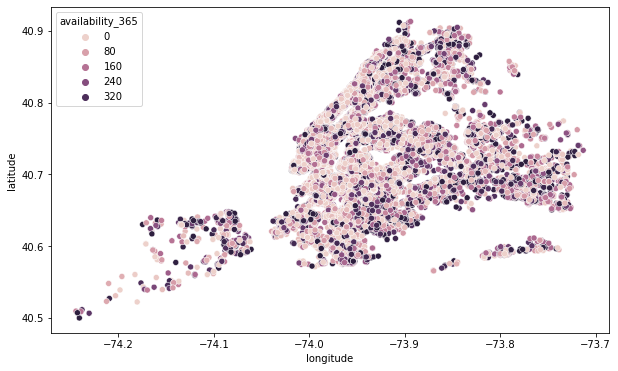

In [32]:
# Generation of the listing location with its availability

plt.figure(figsize=(10,6))
sns.scatterplot(airbnb.longitude,airbnb.latitude,hue=airbnb.availability_365)
plt.ioff()

In [33]:
# Generation of the listing locations according to the neighbourhood groups

fig = px.scatter_mapbox(airbnb, lat = "latitude", lon = "longitude", hover_name = "neighbourhood", hover_data = ["neighbourhood_group"],
                        color_discrete_sequence = ["indigo"], zoom = 3, height = 300)
fig.update_layout(mapbox_style = "open-street-map")
fig.update_layout(margin = {"r":0,"t":0,"l":0,"b":0})
fig.show()

# Visual Representation and Inferences - Room Category

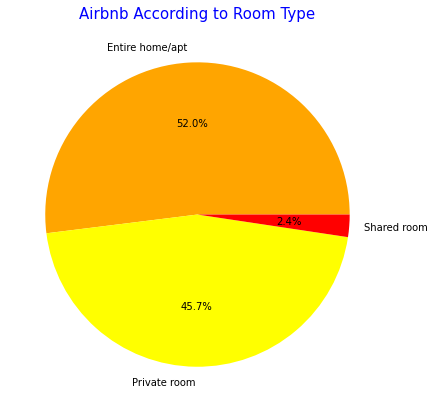

In [34]:
# Generation of the listings data according to their Room Category type

labels = airbnb.room_type.value_counts().index
colors = ['orange','yellow','red']
explode = [0,0,0]
sizes = airbnb.room_type.value_counts().values

plt.figure(0,figsize = (7,7))
plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%')
plt.title('Airbnb According to Room Type',color = 'blue',fontsize = 15)
plt.show()

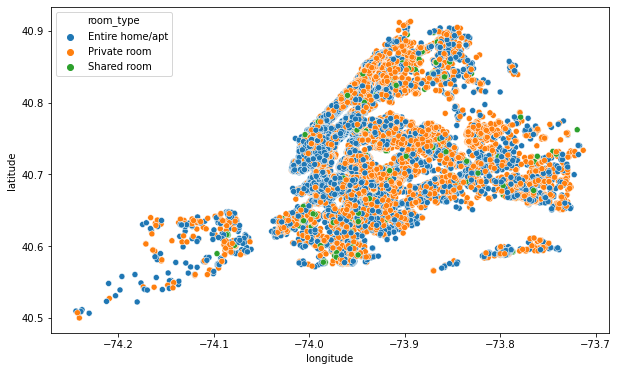

In [35]:
# Visualization of the NYC map data according to their Room Category type

plt.figure(figsize=(10,6))
sns.scatterplot(airbnb.longitude,airbnb.latitude,hue=airbnb.room_type)
plt.ioff()

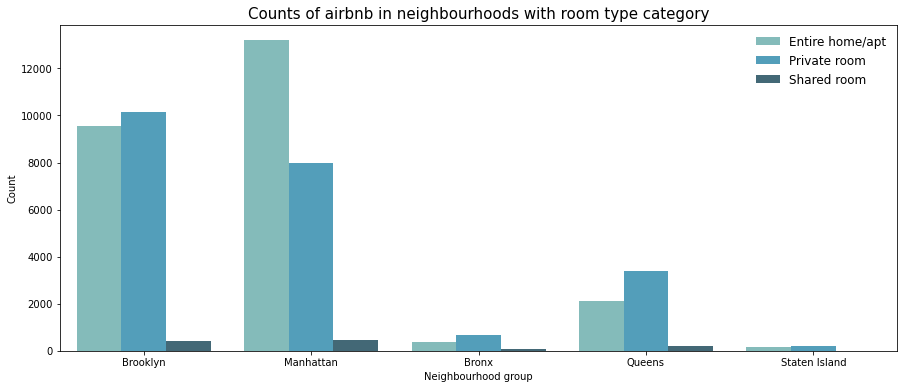

In [36]:
# Representation of the Listings count based on Neighborhood group.

plt.figure(figsize=(15,6))
sns.countplot(data=airbnb, x='neighbourhood_group', hue='room_type', palette='GnBu_d')
plt.title('Counts of airbnb in neighbourhoods with room type category', fontsize=15)
plt.xlabel('Neighbourhood group')
plt.ylabel("Count")
plt.legend(frameon=False, fontsize=12)

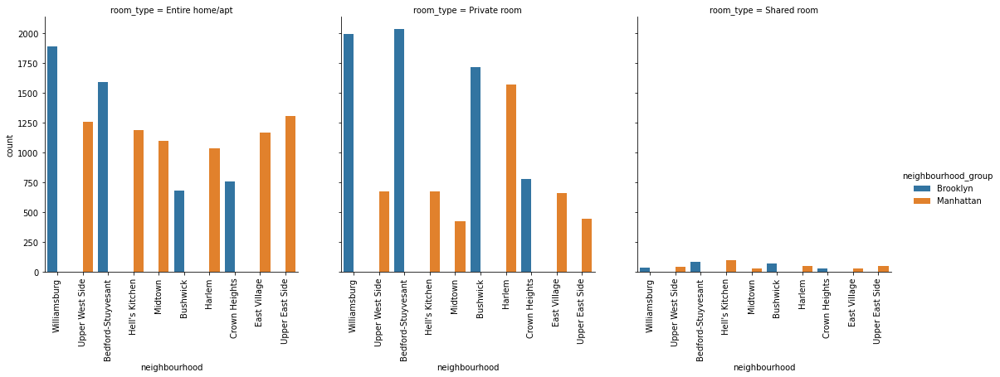

In [37]:
# Grabbing top 10 neighbourhoods for sub-dataframe

sub_7=airbnb.loc[airbnb['neighbourhood'].isin(['Williamsburg','Bedford-Stuyvesant','Harlem','Bushwick',
                 'Upper West Side','Hell\'s Kitchen','East Village','Upper East Side','Crown Heights','Midtown'])]
#using catplot to represent multiple interesting attributes together and a count
viz_3=sns.catplot(x='neighbourhood', hue='neighbourhood_group', col='room_type', data=sub_7, kind='count')
viz_3.set_xticklabels(rotation=90)

Amazing, but let' breakdown on what we can see from this plot. First, we can see that our plot consists of 3 subplots - that is the power of using catplot; with such output, we can easily proceed with comparing distributions among interesting attributes. Y and X axes stay exactly the same for each subplot, Y-axis represents a count of observations and X-axis observations we want to count. However, there are 2 more important elements: column and hue; those 2 differentiate subplots. After we specify the column and determined hue we are able to observe and compare our Y and X axes among specified column as well as color-coded. So, what do we learn from this? The observation that is definitely contrasted the most is that 'Shared room' type Airbnb listing is barely available among 10 most listing-populated neighborhoods. Then, we can see that for these 10 neighborhoods only 2 boroughs are represented: Manhattan and Brooklyn; that was somewhat expected as Manhattan and Brooklyn are one of the most traveled destinations, therefore would have the most listing availability. We can also observe that Bedford-Stuyvesant and Williamsburg are the most popular for Manhattan borough, and Harlem for Brooklyn.

# Visual Representation and Inferences - Pricing

Text(0.5, 1.0, 'Density and distribution of prices for each neighberhood_group')

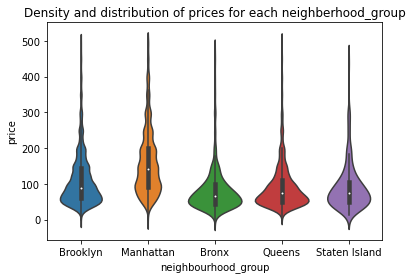

In [38]:
# For the sake of a better visualization, we removed some unwanted data 

#creating a sub-dataframe with no extreme values / less than 500
sub_6=airbnb[airbnb.price < 500]
#using violinplot to showcase density and distribtuion of prices 
viz_2=sns.violinplot(data=sub_6, x='neighbourhood_group', y='price')
viz_2.set_title('Density and distribution of prices for each neighberhood_group')

Great, with a statistical table and a violin plot we can definitely observe a couple of things about distribution of prices for Airbnb in NYC boroughs. First, we can state that Manhattan has the highest range of prices for the listings with \\$150 price as average observation, followed by Brooklyn with \\$90 per night. Queens and Staten Island appear to have very similar distributions, Bronx is the cheapest of them all. This distribution and density of prices were completely expected; for example, as it is no secret that Manhattan is one of the most expensive places in the world to live in, where Bronx on other hand appears to have lower standards of living.

In [39]:
# Generation of top 10 lisitngs with lowest pricing

cheapest = airbnb.sort_values(by = 'price', ascending = True)
cheapest.head(20)[11:]

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
25514,Large furnished 2 bedrooms- - 30 days Minimum,2196224,Manhattan,East Village,40.73051,-73.98140,Entire home/apt,10,30,0,0.00,4,137
39398,Spacious 2-bedroom Apt in Heart of Greenpoint,11967922,Brooklyn,Greenpoint,40.72421,-73.95364,Entire home/apt,10,1,93,4.73,1,32
31036,"Newly renovated, fully furnished room in Brooklyn",62685070,Brooklyn,Bushwick,40.69974,-73.91935,Private room,10,5,0,0.00,1,0
16360,Cozy feel at home studio,91034542,Manhattan,Kips Bay,40.74408,-73.97803,Private room,10,5,42,2.87,1,2
46491,Voted #1 Airbnb In NYC,197169969,Queens,Jamaica,40.68939,-73.79886,Entire home/apt,10,2,22,1.76,1,332
20560,Gigantic Sunny Room in Park Slope-Private Back...,167570251,Brooklyn,Sunset Park,40.66242,-73.99464,Entire home/apt,10,1,14,1.06,1,4
37371,Room with a view,110049861,Brooklyn,Williamsburg,40.70959,-73.95693,Private room,10,1,0,0.00,1,83
20576,"Girls only, cozy room one block from Times Square",47336995,Manhattan,Hell's Kitchen,40.75812,-73.98935,Shared room,10,1,2,0.08,1,0
11973,"Charming, bright and brand new Bed-Stuy home",647528,Brooklyn,Bedford-Stuyvesant,40.69508,-73.95164,Entire home/apt,10,3,5,0.51,1,0


In [40]:
# Generation of top 10 lisitngs with highest pricing

luxury = airbnb.sort_values(by = 'price', ascending = False)
luxury.head(10)

,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
27313,Luxury 1 bedroom apt. -stunning Manhattan views,5143901,Brooklyn,Greenpoint,40.73260,-73.95739,Entire home/apt,10000,5,5,0.16,1,0
20263,Furnished room in Astoria apartment,20582832,Queens,Astoria,40.76810,-73.91651,Private room,10000,100,2,0.04,1,0
1114,1-BR Lincoln Center,72390391,Manhattan,Upper West Side,40.77213,-73.98665,Entire home/apt,10000,30,0,0.00,1,83
36253,"Quiet, Clean, Lit @ LES & Chinatown",3906464,Manhattan,Lower East Side,40.71355,-73.98507,Private room,9999,99,6,0.14,1,83
2227,2br - The Heart of NYC: Manhattans Lower East ...,4382127,Manhattan,Lower East Side,40.71980,-73.98566,Entire home/apt,9999,30,0,0.00,1,365
41161,Spanish Harlem Apt,1235070,Manhattan,East Harlem,40.79264,-73.93898,Entire home/apt,9999,5,1,0.02,1,0
7117,Beautiful/Spacious 1 bed luxury flat-TriBeCa/Soho,18128455,Manhattan,Tribeca,40.72197,-74.00633,Entire home/apt,8500,30,2,0.18,1,251
19772,Film Location,1177497,Brooklyn,Clinton Hill,40.69137,-73.96723,Entire home/apt,8000,1,1,0.03,11,365
18403,East 72nd Townhouse by (Hidden by Airbnb),156158778,Manhattan,Upper East Side,40.76824,-73.95989,Entire home/apt,7703,1,0,0.00,12,146
2753,70' Luxury MotorYacht on the Hudson,7407743,Manhattan,Battery Park City,40.71162,-74.01693,Entire home/apt,7500,1,0,0.00,1,364


In [41]:
# Finding avg price of top reviewed listings

price_avrg=top_reviewed_listings.price.mean()
print('Average price per night: {}'.format(price_avrg))

Average price per night: 65.4


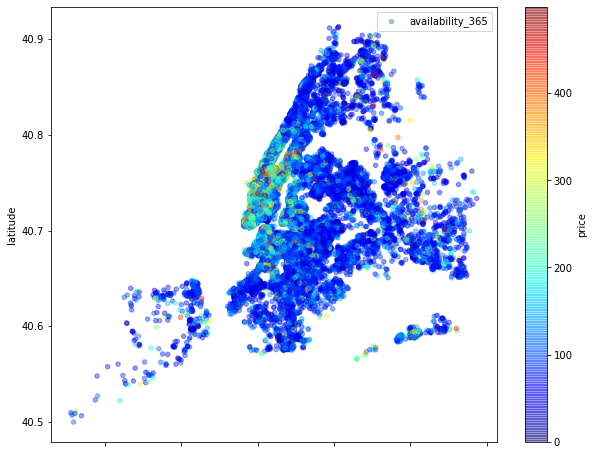

In [42]:
# Generation of scatterplot of price w.r.t. latitude and longitude

viz_4=sub_6.plot(kind='scatter', x='longitude', y='latitude', label='availability_365', c='price',
                  cmap=plt.get_cmap('jet'), colorbar=True, alpha=0.4, figsize=(10,8))
viz_4.legend()

Good, scatterplot worked just fine to output our latitude and longitude points. However, it would be nice to have a map bellow for fully immersive heatmap in ourcase - let's see what we can do!

Fantastic! After scaling our image the best we can, we observe that we end up with a very immersive heatmap. Using latitude and longitude points were able to visualize all NYC listings. Also, we added a color-coded range for each point on the map based on the price of the listing. However, it is important to note that we had to drop some extremely high values as they are treated as outliers for our analysis. 

In [43]:
# Generation of specific data for pricing heatmap

airbnb_rich_hosts=pd.DataFrame(airbnb.iloc[:,0:2])
airbnb_rich_hosts['latitude']=airbnb.iloc[:,4]
airbnb_rich_hosts['longitude']=airbnb.iloc[:,5]
airbnb_rich_hosts['room_type']=airbnb.iloc[:,6]
airbnb_rich_hosts['price']=airbnb.iloc[:,7]
airbnb_rich_hosts.head(5)

,name,host_id,latitude,longitude,room_type,price
0,1 Bed Apt in Utopic Williamsburg,1506795,40.71188,-73.96080,Entire home/apt,155
1,2-3 bedroom UWS garden triplex,5162192,40.79795,-73.96175,Entire home/apt,300
2,3 bedroom loft in Williamsburg,17218916,40.71170,-73.96321,Entire home/apt,500
3,A charming Space in Brooklyn,7557833,40.69180,-73.94673,Private room,95
4,AMAZING TIME SQUARE!!BRICK WALLS!!,1475015,40.76073,-73.99215,Entire home/apt,115


In [44]:
# Generation of heatmap based on Pricing, Latitude and Longitude spread across each neighborhood  group.

import folium
from folium.plugins import HeatMap
m=folium.Map([40.7128,-74.0060],zoom_start=11)
HeatMap(airbnb_rich_hosts[['latitude','longitude']].dropna(),radius=8,gradient={0.2:'blue',0.4:'purple',0.6:'orange',1.0:'red'}).add_to(m)
display(m)

### Conclusion

##### _Summarizing our findings, suggesting other features_

This Airbnb ('AB_NYC_2019') dataset for the 2019 year appeared to be a very rich dataset with a variety of columns that allowed us to do deep data exploration on each significant column presented. First, we have found hosts that take good advantage of the Airbnb platform and provide the most listings; we found that our top host has 327 listings. Further, we graphically representted the reviews data w.r.t the neighborhood  data and analyzed existing listings for their popularity and market demand.Then the data is classified based on their spatial geographical distributions and room category types. Lastly, one of the most important factor "Pricing" is analyzed wrt multiple features and heat map was generated for lucid understanding and taking meaningful decisions for choosing a listing. For our data exploration purposes, it also would be nice to have couple additional features, such as positive and negative numeric (0-5 stars) reviews or 0-5 star average review for each listing; addition of these features would help to determine the best-reviewed hosts for NYC along with 'number_of_review' column that is provided. Overall, we discovered a very good number of interesting relationships between features and tried to explained each step of the process by visual representation for the same. This data analytics is very much mimicked on a higher level on Airbnb Data/Machine Learning team for better business decisions, control over the platform, marketing initiatives, implementation of new features and much more. Therefore,we hope this project will serve for the community as a whole!!